# Import Libraries

In [1]:
from PIL import Image
from colorama import Fore, Style
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import colorama
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import warnings
warnings.filterwarnings('ignore') 

# Import Dataset

In [2]:
Root_dir = "/kaggle/input/plantvillage-split/plantvillage_split"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/val"
test_dir = "/kaggle/input/plantvillage-split/plantvillage_split/test_dataset"
Diseases_classes = os.listdir(train_dir)

# Data Preprocessing

In [3]:
print(Fore.GREEN +str(Diseases_classes))
print("\nTotal number of classes are: ", len(Diseases_classes))

['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Late_blight', 'Tomato___Tomato_mosaic_virus', 'Strawberry___healthy', 'Apple___healthy', 'Grape___Black_rot', 'Potato___Early_blight', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Common_rust_', 'Grape___Esca_(Black_Measles)', 'Raspberry___healthy', 'Tomato___Leaf_Mold', 'Tomato__

In [4]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)
    
    image_path = os.listdir(train_dir + "/" + i)
    print(Fore.GREEN)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)
    
    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])
    
    plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])
    
    
print("\nTotal Number of Images in Directory: ", tot_images)


The Number of Images in Tomato___Late_blight: 4581 
The Number of Images in Tomato___healthy: 3816 
The Number of Images in Grape___healthy: 1014 
The Number of Images in Orange___Haunglongbing_(Citrus_greening): 13215 
The Number of Images in Soybean___healthy: 12216 
The Number of Images in Squash___Powdery_mildew: 4404 
The Number of Images in Potato___healthy: 363 
The Number of Images in Corn_(maize)___Northern_Leaf_Blight: 2364 
The Number of Images in Tomato___Early_blight: 2400 
The Number of Images in Tomato___Septoria_leaf_spot: 4248 
The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1230 
The Number of Images in Strawberry___Leaf_scorch: 2661 
The Number of Images in Peach___healthy: 864 
The Number of Images in Apple___Apple_scab: 1512 
The Number of Images in Tomato___Tomato_Yellow_Leaf_Curl_Virus: 12855 
The Number of Images in Tomato___Bacterial_spot: 5103 
The Number of Images in Apple___Black_rot: 1488 
The Number of Images in Blueberry___hea

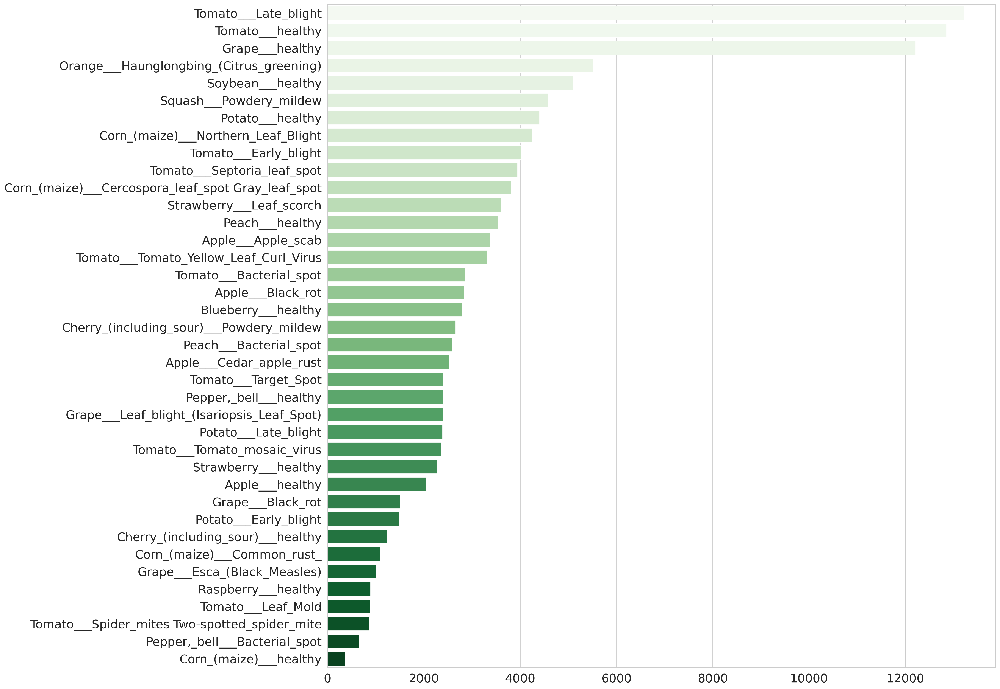

In [5]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [6]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

train = ImageFolder(train_dir, transform=transform)
valid = ImageFolder(valid_dir, transform=transform)
test = ImageFolder(test_dir, transform=transform)

def verify_image_dimensions(dataset, expected_shape=(3, 256, 256)):
    """Verify that all images in the dataset have the expected shape"""
    for i in range(len(dataset)):
        img, _ = dataset[i]
        if img.shape != expected_shape:
            print(f"Warning: Image {i} has shape {img.shape}, expected {expected_shape}")
            return False
    print(f"All images verified to have shape {expected_shape}")
    return True

verify_image_dimensions(train)
verify_image_dimensions(valid)
verify_image_dimensions(test)

All images verified to have shape (3, 256, 256)
All images verified to have shape (3, 256, 256)
All images verified to have shape (3, 256, 256)


True

In [7]:
train

Dataset ImageFolder
    Number of datapoints: 130288
    Root location: /kaggle/input/plantvillage-split/plantvillage_split/train
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
           )

In [8]:
train[0]

(tensor([[[0.6549, 0.6510, 0.6471,  ..., 0.7255, 0.7176, 0.7098],
          [0.6667, 0.6627, 0.6588,  ..., 0.7294, 0.7216, 0.7176],
          [0.6667, 0.6627, 0.6588,  ..., 0.7373, 0.7294, 0.7255],
          ...,
          [0.3922, 0.4000, 0.4078,  ..., 0.4941, 0.4941, 0.4941],
          [0.3961, 0.4000, 0.4039,  ..., 0.4784, 0.4824, 0.4824],
          [0.4078, 0.4039, 0.4000,  ..., 0.4745, 0.4784, 0.4824]],
 
         [[0.6392, 0.6353, 0.6314,  ..., 0.7137, 0.7059, 0.6980],
          [0.6510, 0.6471, 0.6431,  ..., 0.7176, 0.7098, 0.7059],
          [0.6510, 0.6471, 0.6431,  ..., 0.7255, 0.7176, 0.7137],
          ...,
          [0.3529, 0.3608, 0.3686,  ..., 0.4314, 0.4314, 0.4314],
          [0.3569, 0.3608, 0.3647,  ..., 0.4157, 0.4196, 0.4196],
          [0.3686, 0.3647, 0.3608,  ..., 0.4118, 0.4157, 0.4196]],
 
         [[0.7686, 0.7647, 0.7608,  ..., 0.8275, 0.8196, 0.8118],
          [0.7804, 0.7765, 0.7725,  ..., 0.8314, 0.8235, 0.8196],
          [0.7804, 0.7765, 0.7725,  ...,

In [9]:
train[7000]

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0627, 0.0118, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.1608, 0.0824, 0.0353],
          [0.0000, 0.0000, 0.0000,  ..., 0.1059, 0.0157, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0667, 0.0196, 0.0039],
          [0.0000, 0.0000, 0.0000,  ..., 0.1647, 0.0902, 0.0431],
          [0.0000, 0.0000, 0.0000,  ..., 0.1098, 0.0235, 0.0039]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

In [10]:
train[70000]

(tensor([[[0.7647, 0.8157, 0.7529,  ..., 0.8667, 0.8549, 0.7961],
          [0.9020, 0.7490, 0.7373,  ..., 0.8157, 0.8157, 0.7882],
          [0.8706, 0.7961, 0.7647,  ..., 0.8078, 0.8118, 0.8118],
          ...,
          [0.5961, 0.7765, 0.6824,  ..., 0.7020, 0.6941, 0.6784],
          [0.5725, 0.7098, 0.5176,  ..., 0.7137, 0.7098, 0.6941],
          [0.6824, 0.7137, 0.6510,  ..., 0.7412, 0.7373, 0.7255]],
 
         [[0.7098, 0.7608, 0.6980,  ..., 0.8196, 0.8078, 0.7490],
          [0.8471, 0.6941, 0.6824,  ..., 0.7686, 0.7686, 0.7412],
          [0.8157, 0.7412, 0.7098,  ..., 0.7608, 0.7647, 0.7647],
          ...,
          [0.5255, 0.7059, 0.6118,  ..., 0.6471, 0.6392, 0.6235],
          [0.5020, 0.6392, 0.4471,  ..., 0.6588, 0.6549, 0.6392],
          [0.6118, 0.6431, 0.5804,  ..., 0.6863, 0.6824, 0.6706]],
 
         [[0.6980, 0.7490, 0.6863,  ..., 0.8196, 0.8078, 0.7490],
          [0.8353, 0.6824, 0.6706,  ..., 0.7686, 0.7686, 0.7412],
          [0.8039, 0.7294, 0.6980,  ...,

In [11]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0



Label :Apple___Apple_scab(0)

Label :Apple___Cedar_apple_rust(2)

Label :Apple___healthy(3)

Label :Blueberry___healthy(4)

Label :Cherry_(including_sour)___Powdery_mildew(5)

Label :Cherry_(including_sour)___healthy(6)

Label :Pepper,_bell___healthy(19)

Label :Soybean___healthy(24)


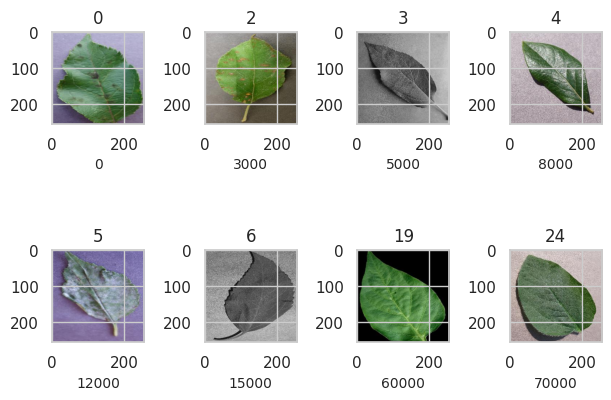

In [12]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
    
    
image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]
    
chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

In [13]:
batch_size = 32

In [14]:
# DataLoaders for training and validation
train_dataloader = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size, num_workers=2, pin_memory=True)

# Device Configuration

In [15]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

In [16]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [17]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [18]:
device = get_default_device()
device

device(type='cuda')

In [19]:
# Moving data into GPU, WrappedDataLoader
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

# Neural Network (CNN)

In [20]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [21]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [22]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

In [23]:
# resnet architecture 
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) 
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        
        self.conv3 = ConvBlock(128, 256, pool=True) 
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)
        
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))
        
    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out        

In [24]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train.classes)), device) 
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

In [25]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [26]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [27]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy. 
    #The 1cycle policy anneals the learning rate from an initial learning rate to some 
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate. 
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation
        
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history
    

In [28]:
%%time
history = [evaluate(model, valid_dataloader)]
history

CPU times: user 1min 9s, sys: 11.1 s, total: 1min 20s
Wall time: 1min 4s


[{'val_loss': 3.632688045501709, 'val_acc': 0.09852941334247589}]

In [29]:
num_epoch = 5
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

In [30]:
%%time
history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader, 
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=optims)

# After training, save the model
model_save_path = 'plant_disease_model.pth'
torch.save({
    'model_state_dict': model.state_dict(),
    'class_names': train.classes
}, model_save_path)
print(f"Model saved to {model_save_path}")

Epoch [0], train_loss: 0.7263, val_loss: 0.4992, val_acc: 0.8435
Epoch [1], train_loss: 0.4503, val_loss: 0.5001, val_acc: 0.8486
Epoch [2], train_loss: 0.3104, val_loss: 0.3325, val_acc: 0.8941
Epoch [3], train_loss: 0.1754, val_loss: 0.1167, val_acc: 0.9604
Epoch [4], train_loss: 0.0643, val_loss: 0.0582, val_acc: 0.9812
Model saved to plant_disease_model.pth
CPU times: user 42min 35s, sys: 37min 51s, total: 1h 20min 27s
Wall time: 1h 14min


# Result

In [31]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

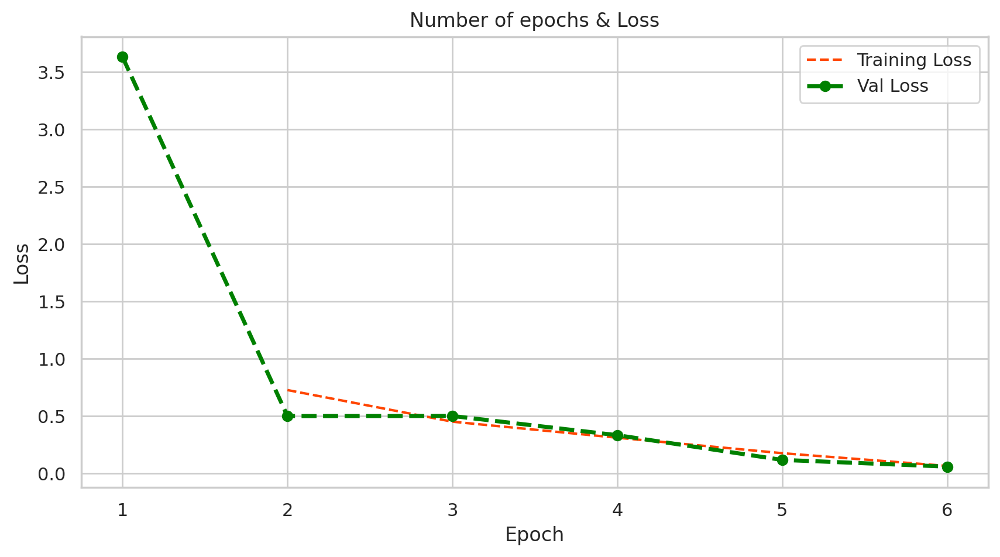

In [32]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

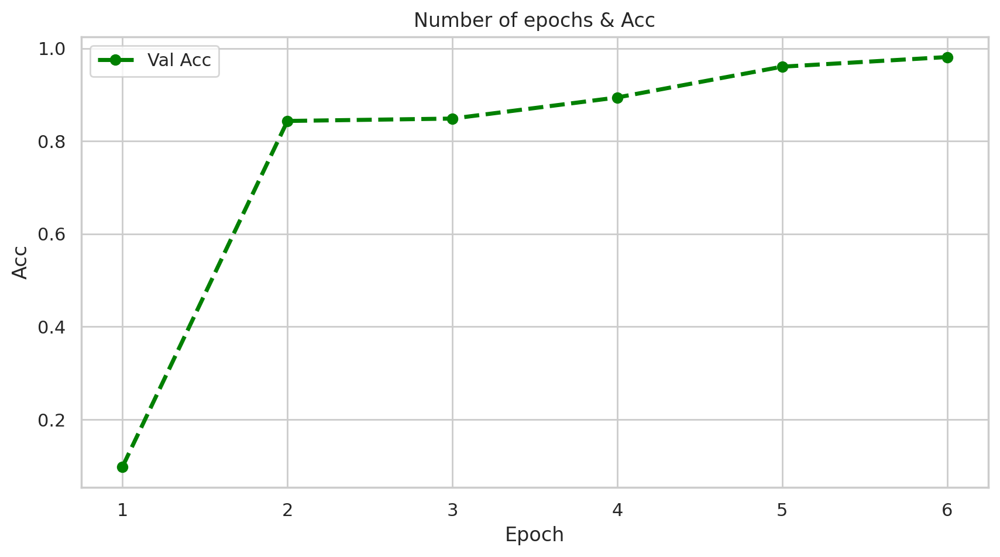

In [33]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show();

In [34]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

test = ImageFolder(test_dir, transform=transform)
test_images = sorted(os.listdir(test_dir + '/test'))
print(Fore.GREEN)
print(test_images)
print(len(test_images))


['Apple___Apple_scab_1.jpg', 'Apple___Black_rot_1.JPG', 'Apple___Cedar_apple_rust_1.JPG', 'Apple___healthy_1.JPG', 'Blueberry___healthy_1.JPG', 'Corn_(maize)___Common_rust__1.JPG', 'Corn_(maize)___Northern_Leaf_Blight_1.jpg', 'Corn_(maize)___healthy_1.jpg', 'Grape___Esca_(Black_Measles)_1.jpg', 'Grape___Esca_(Black_Measles)_2.JPG', 'Orange___Haunglongbing_(Citrus_greening)_1.jpg', 'Orange___Haunglongbing_(Citrus_greening)_2.JPG', 'Peach___Bacterial_spot_1.JPG', 'Pepper,_bell___healthy_1.JPG', 'Potato___Early_blight_1.jpg', 'Raspberry___healthy_1.JPG', 'Soybean___healthy_1.JPG', 'Squash___Powdery_mildew_1.JPG', 'Tomato___Bacterial_spot_1.jpg', 'Tomato___Early_blight_1.jpg', 'Tomato___Early_blight_2.JPG', 'Tomato___Late_blight_1.JPG', 'Tomato___Leaf_Mold_1.JPG', 'Tomato___Septoria_leaf_spot_1.JPG', 'Tomato___Septoria_leaf_spot_2.jpg', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus_1.jpg', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus_2.jpg', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus_3.jpg', 'Tomato___

In [35]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]


Label: Apple___Black_rot_1.JPG , Predicted: Apple___Black_rot


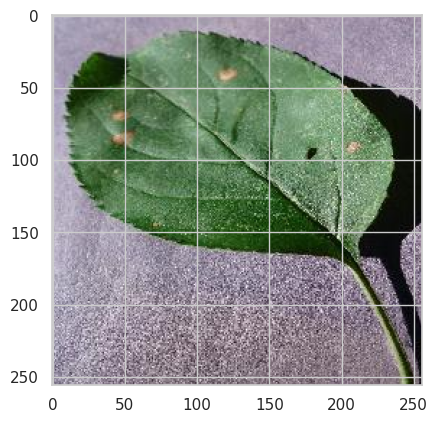

In [36]:
# predicting first image
img, label = test[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[1], ', Predicted:', predict_image(img, model))


Label: Corn_(maize)___Common_rust__1.JPG , Predicted: Corn_(maize)___Common_rust_


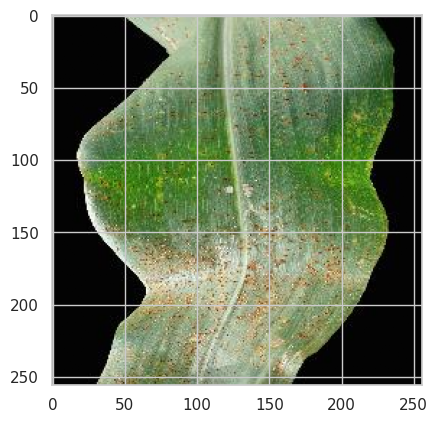

In [37]:
# predicting first image
img, label = test[5]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[5], ', Predicted:', predict_image(img, model))


Label: Grape___Esca_(Black_Measles)_2.JPG , Predicted: Grape___Esca_(Black_Measles)


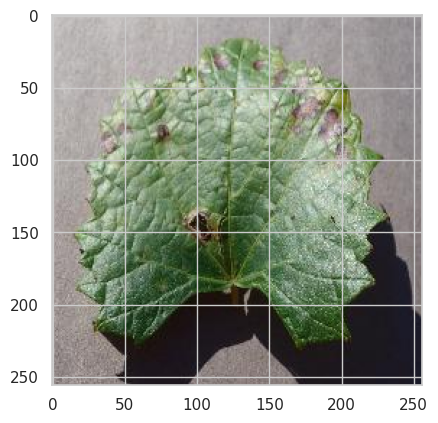

In [38]:
# predicting first image
img, label = test[9]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[9], ', Predicted:', predict_image(img, model))


Label: Soybean___healthy_1.JPG , Predicted: Soybean___healthy


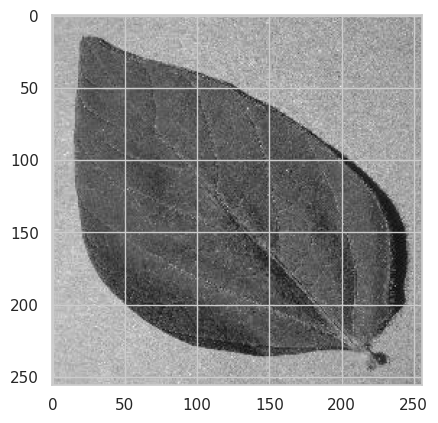

In [39]:
# predicting first image
img, label = test[16]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[16], ', Predicted:', predict_image(img, model))


Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus_2.jpg , Predicted: Tomato___Tomato_Yellow_Leaf_Curl_Virus


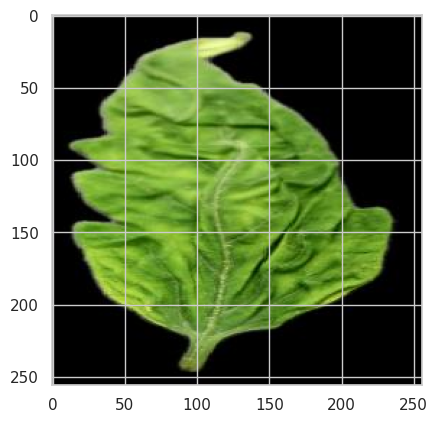

In [40]:
# predicting first image
img, label = test[26]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[26], ', Predicted:', predict_image(img, model))

In [41]:
# getting all predictions (actual label vs predicted)
for i, (img, label) in enumerate(test):
    print(Fore.GREEN)
    print('Label:', test_images[i], ', Predicted:', predict_image(img, model))


Label: Apple___Apple_scab_1.jpg , Predicted: Apple___Apple_scab

Label: Apple___Black_rot_1.JPG , Predicted: Apple___Black_rot

Label: Apple___Cedar_apple_rust_1.JPG , Predicted: Apple___Cedar_apple_rust

Label: Apple___healthy_1.JPG , Predicted: Apple___healthy

Label: Blueberry___healthy_1.JPG , Predicted: Blueberry___healthy

Label: Corn_(maize)___Common_rust__1.JPG , Predicted: Corn_(maize)___Common_rust_

Label: Corn_(maize)___Northern_Leaf_Blight_1.jpg , Predicted: Corn_(maize)___Northern_Leaf_Blight

Label: Corn_(maize)___healthy_1.jpg , Predicted: Corn_(maize)___healthy

Label: Grape___Esca_(Black_Measles)_1.jpg , Predicted: Grape___Esca_(Black_Measles)

Label: Grape___Esca_(Black_Measles)_2.JPG , Predicted: Grape___Esca_(Black_Measles)

Label: Orange___Haunglongbing_(Citrus_greening)_1.jpg , Predicted: Orange___Haunglongbing_(Citrus_greening)

Label: Orange___Haunglongbing_(Citrus_greening)_2.JPG , Predicted: Orange___Haunglongbing_(Citrus_greening)

Label: Peach___Bacterial_